<img src="https://nserc-hi-am.ca/2020/wp-content/uploads/sites/18/2019/12/McGill.png" width="500" height="400" align="left">

<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>


# INSY 695: Final Group Project
#### Arnaud Guzman-Annès | ID: 260882529
#### Jules Zielinski Babu | ID: 
#### Ram Babu | ID: 260958970
#### Dorothy Zou | ID: 260950477
#### Rameez Rosul | ID: 
#### Johnny Qiao | ID: 

<br>
<br>

**Date: April 1st, 2021**
<br>
<br>

In [1]:
## Initial setup

# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os
import io
import requests
import pandas as pd
import seaborn as sns

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")
pd.options.mode.chained_assignment = None  # default='warn'

In [2]:
# Sets seed for the entire notebook

np.random.seed(42)

In [3]:
# Import data

url = "https://raw.githubusercontent.com/arguz95/Project_ML2/master/Data/bankrupcy.csv"
download = requests.get(url).content
df = pd.read_csv(io.StringIO(download.decode('utf-8')))
bankruptcy = df.copy() # we can use this as raw data afterwards

In [4]:
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share,Per Share Net profit before tax,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256970e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820930e-04,1.165010e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897850e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.006889,0.391590,0.0123

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Bankrupt?                                                6819 non-null   int64  
 1   ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2   ROA(A) before interest and % after tax                   6819 non-null   float64
 3   ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4   Operating Gross Margin                                   6819 non-null   float64
 5   Realized Sales Gross Margin                              6819 non-null   float64
 6   Operating Profit Rate                                    6819 non-null   float64
 7   Pre-tax net Interest Rate                                6819 non-null   float64
 8   After-tax net Interest Rate 

*No missing values and no categorical variables in the dataset*

In [6]:
# Some more information about the dataset


#display(df.shape)
#display(df.isnull().sum())
#display(df.describe())

(6819, 96)

Bankrupt?                                                  0
ROA(C) before interest and depreciation before interest    0
ROA(A) before interest and % after tax                     0
ROA(B) before interest and depreciation after tax          0
Operating Gross Margin                                     0
Realized Sales Gross Margin                                0
Operating Profit Rate                                      0
Pre-tax net Interest Rate                                  0
After-tax net Interest Rate                                0
Non-industry income and expenditure/revenue                0
Continuous interest rate (after tax)                       0
Operating Expense Rate                                     0
Research and development expense rate                      0
Cash flow rate                                             0
Interest-bearing debt interest rate                        0
Tax rate (A)                                               0
Net Value Per Share (B) 

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share,Per Share Net profit before tax,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,1.995347e+09,1.950427e+09,0.467431,1.644801e+07,0.115001,0.190661,0.19

In [7]:
# Cheking for unique values

#display(df['Liability-Assets Flag'].nunique())
#display(df['Net Income Flag'].nunique())

2

1

In [8]:
# Dropping these 2 columnds

# Liability-Assets Flag
# Net Income Flag

df['Liability-Assets Flag'].value_counts() 
df['Liability-Assets Flag'].corr(df['Bankrupt?'])

#df = df.drop(['Liability-Assets Flag'], axis=1)
df = df.drop(['Net Income Flag'], axis=1)

Text(0, 0.5, 'Number of companies')

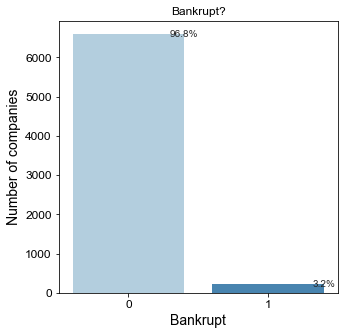

In [9]:
# We are checking for imbalanced data
# Print figure

import seaborn as sns

plt.figure(figsize=(5,5))
splot = sns.countplot(data = df,x = 'Bankrupt?',palette = 'Blues')
sns.set_style('ticks')
total = float(len(df))
for p in splot.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    splot.annotate(percentage, (x,y), ha = 'center', va = 'center')
plt.title("Bankrupt?")
plt.xlabel("Bankrupt")
plt.ylabel("Number of companies")

In [10]:
# We are going to work later on on this issue.

<AxesSubplot:>

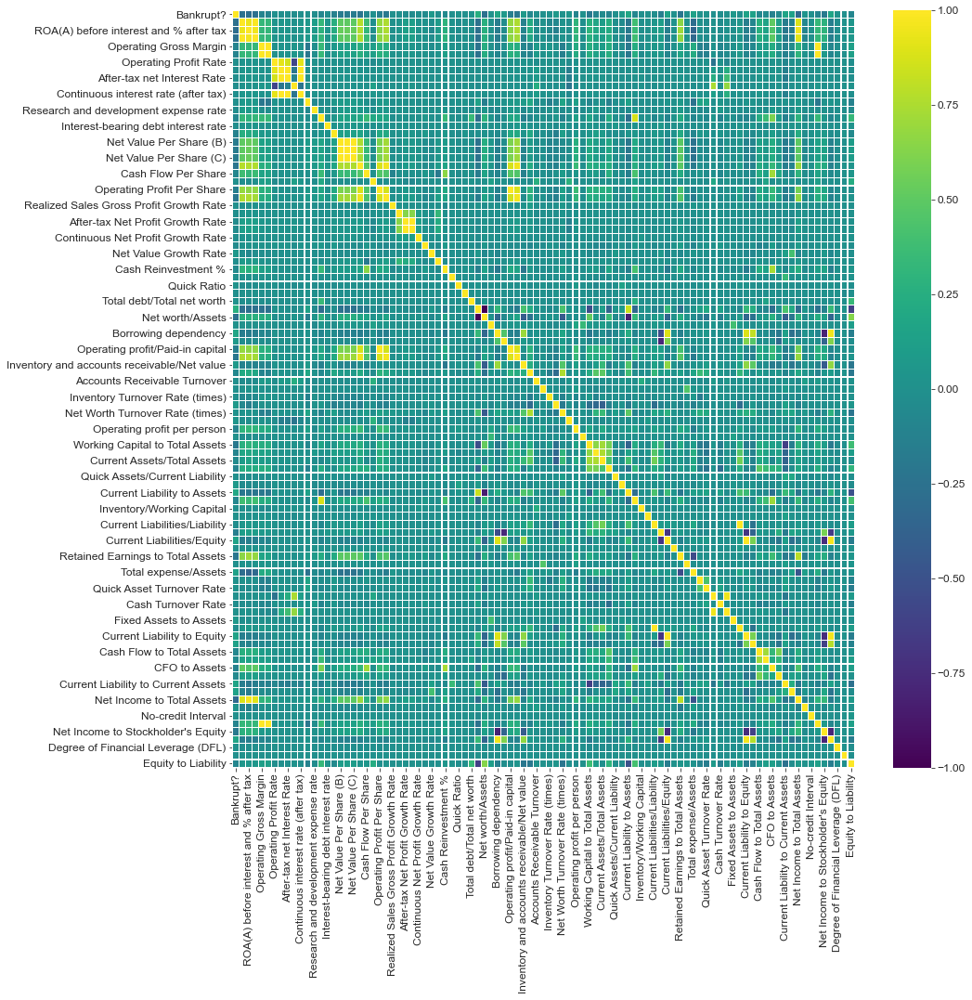

In [11]:
# Correlation

corr = df.corr()
fig, ax = plt.subplots(figsize = (15,15))
sns.heatmap(corr, ax = ax, cmap = 'viridis', linewidth = 0.1)

In [12]:
# Variable creation
X = df.drop(['Bankrupt?'], axis=1)
y = df['Bankrupt?']

In [13]:
X.head()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share,Per Share Net profit before tax,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256970e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820930e-04,1.165010e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897850e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.006889,0.391590,0.012335,0.751111,0.127236,0.182419,0.

In [14]:
#display(X.shape)
#display(y.shape)

(6819, 94)

(6819,)

## Preparing Data for ML models
*Splitting the data*

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test_final, y_train, y_test_final = train_test_split(X,y, test_size=0.2, random_state=42)

In [16]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_train,y_train, test_size=0.25, random_state=42)

In [17]:
X_train.shape

(4091, 94)

In [18]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

num_pipeline = Pipeline([('std_scaler', StandardScaler())])

num_attribs = list(X_train)

full_pipeline = ColumnTransformer([("num", num_pipeline, num_attribs)])

In [19]:
X_train_prepared = full_pipeline.fit_transform(X_train)
X_test_prepared = full_pipeline.transform(X_test)
X_test_final_prepared = full_pipeline.transform(X_test_final)

In [20]:
X_train_prepared = pd.DataFrame(X_train_prepared, columns=num_attribs)
X_test_prepared = pd.DataFrame(X_test_prepared, columns=num_attribs)
X_test_final_prepared = pd.DataFrame(X_test_final_prepared, columns=num_attribs)

In [21]:
'''
#Scaling
from sklearn.preprocessing import StandardScaler
x_col = X.columns
scaler = StandardScaler()
x_scaled = scaler.fit_transform(X)
X = pd.DataFrame(x_scaled)
X.columns = x_col
#X.apply(pd.to_numeric)
display(X.head())
'''

'\n#Scaling\nfrom sklearn.preprocessing import StandardScaler\nx_col = X.columns\nscaler = StandardScaler()\nx_scaled = scaler.fit_transform(X)\nX = pd.DataFrame(x_scaled)\nX.columns = x_col\n#X.apply(pd.to_numeric)\ndisplay(X.head())\n'

In [22]:
#display(X_train.shape)
#display(y_train.shape)

(4091, 94)

(4091,)

In [23]:
count = 0
for i in y_train:
    if i == 1:
        count +=1
#print("There are",count,"cases of bankruptcy and",len(y_train)-count,"of non-bankruptcy")

There are 128 cases of bankruptcy and 3963 of non-bankruptcy


In [24]:
y_train = pd.DataFrame(y_train)
y_test = pd.DataFrame(y_test)

In [25]:
y_train.reset_index(inplace=True)
y_train.drop(columns='index',axis=1,inplace=True)
y_test.reset_index(inplace=True)
y_test.drop(columns='index',inplace=True)
y_train.head()

,Bankrupt?
0,0
1,0
2,0
3,0
4,0


## Feature Selection, resampling and data transformation

In [30]:
#Anomaly Detection
from sklearn.ensemble import IsolationForest
iforest = IsolationForest(n_estimators=100,contamination=0.01)
pred = iforest.fit_predict(X_train_prepared)
score = iforest.decision_function(X_train_prepared)
from numpy import where
anom_index = where(pred==-1)
values = X.iloc[anom_index]

for i in values.index:
    X_train_prepared = X_train_prepared.drop(i)
    y_train = y_train.drop(i)

In [31]:
ctr = len(values)
#print("Number of observations dropped = {}".format(ctr))

Number of observations dropped = 41


In [32]:
# Modelling with balanced target 

from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

model = RandomForestClassifier(n_estimators=1000, n_jobs=-1)
model.fit(X_train_prepared, y_train)

sel = SelectFromModel(model)
sel.fit(X_test_prepared, y_test)

selected_feat= X_train.columns[(sel.get_support())]

C:\Users\Dell\anaconda3\lib\site-packages\ipykernel_launcher.py:7: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_from_model.py:234: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [34]:
# Dealing with imbalanced data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

over = SMOTE(sampling_strategy = 0.2)
under = RandomUnderSampler(sampling_strategy = 0.6)

steps = [('o',over),('u',under)]
pipeline = Pipeline(steps = steps)

#X_train_prepared, y_train = pipeline.fit_resample(X_train_prepared, y_train)
over_sample=SMOTE()
X_train_prepared, y_train=over_sample.fit_resample(X_train_prepared,y_train)

In [35]:
#display(X_train_prepared.shape)
#display(y_train.shape)

(7866, 94)

(7866, 1)

Text(0, 0.5, 'Number of companies')

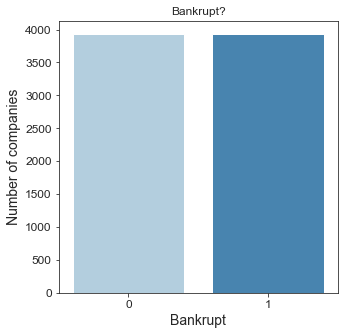

In [36]:
plt.figure(figsize=(5,5))
splot = sns.countplot(data = y_train, x = 'Bankrupt?', palette = 'Blues')
sns.set_style('ticks')
total = float(len(df))
plt.title("Bankrupt?")
plt.xlabel("Bankrupt")
plt.ylabel("Number of companies")

### Dropping highly correlated columns (greater than 0.85)

In [38]:
import rfpimp
from rfpimp import plot_corr_heatmap
limit = 0.85
corr = X_train_prepared.corr()

In [39]:
mask = np.triu(np.ones(corr.shape), k=1).astype(bool)
corr_no_diag = corr.where(mask)

In [40]:
corr_no_diag

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share,Per Share Net profit before tax,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
ROA(C) before interest and depreciation before interest,NaN,0.951205,0.984858,0.398190,0.395775,0.024575,0.055967,0.050886,0.052672,0.054243,0.141911,-0.011183,0.382978,0.044456,0.413898,0.597080,0.594743,0.592726,0.852027,0.431966,0.006318,0.757834,0.840217,0.010025,0.035525,0.104397,0.105705,0.051595,0.148417,0.006726,0.097058,0.354763,0.016404,-0.058356,0.034558,-0.020905,-0.381937,0.381937,0.015809,-0.255528,-0.072090,0.757346,0.856204,-0.115647,0.234639,0.002722,-0.001807,0.002212,-0.058254,0.052185,0.029676,0.410027,0.003465,0.353734,0.181398,0.103480,0.243319,0.191939,-0.059790,-0.341904,0.421809,0.004011,0.049583,-0.028019,0.263143,-0.318787,-0.001674,0.758832,0.588877,-0.565951,0.044553,-0.054572,0.004147,0.060089,0.007451,0.009445,-0.028019,-0.318787,-0.042751,0.304787,0.172465,0.540196,0.300140,-0.225898,-0.151422,0.903886,-0.161636,0.046776,0.398191,0.811096,-0.268416,0.012111,0.048988,0.140252
ROA(A) before interest and % after tax,NaN,NaN,0.975648,0.383964,0.381711,0.021321,0.052701,0.048317,0.054109,0.050604,0.149313,-0.057156,0.345065,0.018075,0.380908,0.608506,0.606508,0.605491,0.823444,0.368347,0.008533,0.717369,0.814518,0.011854,0.029464,0.097519,0.099436,0.039959,0.163205,0.009708,0.094558,0.293028,0.016053,-0.044208,0.028717,-0.008058,-0.346536,0.346536,0.018668,-0.230758,-0.040342,0.716498,0.831033,-0.050454,0.226628,0.006344,0.00438

In [41]:
coll = [c for c in corr_no_diag.columns if any(abs(corr_no_diag[c]) > limit)]

In [42]:
## Highly corelated columns
coll

['ROA(A) before interest and % after tax',
 'ROA(B) before interest and depreciation after tax',
 'Realized Sales Gross Margin',
 'Pre-tax net Interest Rate',
 'After-tax net Interest Rate',
 'Continuous interest rate (after tax)',
 'Net Value Per Share (A)',
 'Net Value Per Share (C)',
 'Persistent EPS in the Last Four Seasons',
 'Operating Profit Per Share',
 'Per Share Net profit before tax',
 'Regular Net Profit Growth Rate',
 'Net Value Growth Rate',
 'Net worth/Assets',
 'Operating profit/Paid-in capital',
 'Net profit before tax/Paid-in capital',
 'Operating Funds to Liability',
 'Working Capital/Equity',
 'Current Liabilities/Equity',
 'Cash Flow to Sales',
 'Current Liability to Liability',
 'Current Liability to Equity',
 'CFO to Assets',
 'Cash Flow to Equity',
 'Net Income to Total Assets',
 'Gross Profit to Sales',
 "Net Income to Stockholder's Equity",
 'Liability to Equity']

### Variance threshold

In [43]:
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=(.8 * (1 - .8)))

sel.fit(X_train_prepared)
var = sel.get_support()

col2 = []
for i in range(94):
    if not var[i]:
        col2.append(num_attribs[i])

In [44]:
col2

['Revenue Per Share (Yuan ¥)',
 'Net Value Growth Rate',
 'Contingent liabilities/Net worth',
 'Revenue per person',
 'Quick Assets/Current Liability',
 'Working Capital/Equity',
 "Net Income to Stockholder's Equity"]

In [45]:
## Highly corelated columns with variance > 0.16
col_del = coll.copy()
for i in coll:
    if i not in col2:
        col_del.append(i)
col_del

['ROA(A) before interest and % after tax',
 'ROA(B) before interest and depreciation after tax',
 'Realized Sales Gross Margin',
 'Pre-tax net Interest Rate',
 'After-tax net Interest Rate',
 'Continuous interest rate (after tax)',
 'Net Value Per Share (A)',
 'Net Value Per Share (C)',
 'Persistent EPS in the Last Four Seasons',
 'Operating Profit Per Share',
 'Per Share Net profit before tax',
 'Regular Net Profit Growth Rate',
 'Net Value Growth Rate',
 'Net worth/Assets',
 'Operating profit/Paid-in capital',
 'Net profit before tax/Paid-in capital',
 'Operating Funds to Liability',
 'Working Capital/Equity',
 'Current Liabilities/Equity',
 'Cash Flow to Sales',
 'Current Liability to Liability',
 'Current Liability to Equity',
 'CFO to Assets',
 'Cash Flow to Equity',
 'Net Income to Total Assets',
 'Gross Profit to Sales',
 "Net Income to Stockholder's Equity",
 'Liability to Equity',
 'ROA(A) before interest and % after tax',
 'ROA(B) before interest and depreciation after tax',


In [46]:
## 31 columns removed
X_train_prepared_old = X_train_prepared.copy()
X_train_prepared.drop(columns=col_del,axis=1,inplace=True)

In [47]:
X_train_prepared.shape

(7866, 66)

In [48]:
'''
def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (abs(corr_matrix.iloc[i, j]) >= threshold) and (corr_matrix.columns[j] not in col_corr):
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
                if colname in dataset.columns:
                    del dataset[colname] # deleting the column from the dataset

    return(dataset)

filtered_col = correlation(df, 0.65).columns
df = df[filtered_col]
df
correlation(df, 0.65)
'''

'\ndef correlation(dataset, threshold):\n    col_corr = set() # Set of all the names of deleted columns\n    corr_matrix = dataset.corr()\n    for i in range(len(corr_matrix.columns)):\n        for j in range(i):\n            if (abs(corr_matrix.iloc[i, j]) >= threshold) and (corr_matrix.columns[j] not in col_corr):\n                colname = corr_matrix.columns[i] # getting the name of column\n                col_corr.add(colname)\n                if colname in dataset.columns:\n                    del dataset[colname] # deleting the column from the dataset\n\n    return(dataset)\n\nfiltered_col = correlation(df, 0.65).columns\ndf = df[filtered_col]\ndf\ncorrelation(df, 0.65)\n'

### Tree-Based Feature Selection

C:\Users\Dell\anaconda3\lib\site-packages\ipykernel_launcher.py:9: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



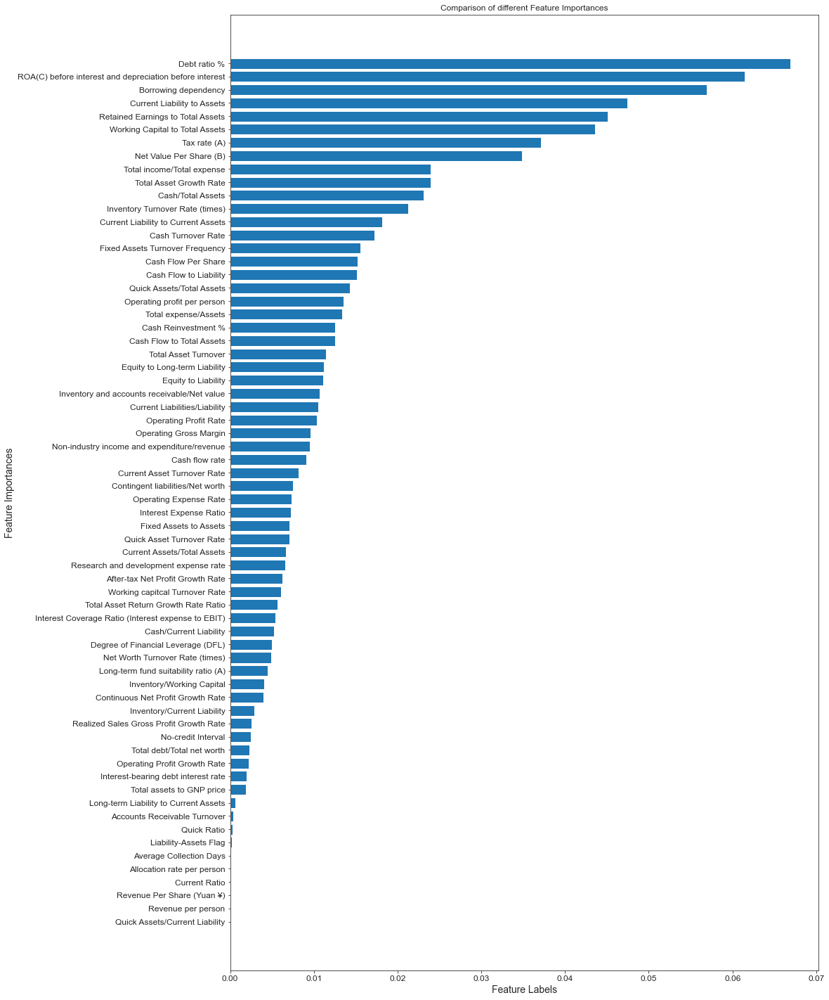

In [49]:
# feature selection (tree-based)

from sklearn.ensemble import ExtraTreesClassifier
from sklearn.datasets import load_iris
from sklearn.feature_selection import SelectFromModel
import matplotlib.pyplot as plt

clf = ExtraTreesClassifier(n_estimators=50, random_state=45)
clf = clf.fit(X_train_prepared, y_train)
feature_importance = clf.feature_importances_
  
# Normalizing the individual importances 
feature_importance_normalized = np.std([tree.feature_importances_ for tree in 
                                        clf.estimators_], 
                                        axis = 0) 

tbfs = pd.DataFrame(
    {"X": X_train_prepared.columns, "FI": feature_importance_normalized}
)

tbfs = tbfs.sort_values('FI',ascending=True)


# Plotting a Bar Graph to compare the models 
plt.figure(figsize=(15,25))
plt.barh(y=tbfs['X'],width=tbfs['FI']) 
plt.xlabel('Feature Labels') 
plt.ylabel('Feature Importances') 
plt.title('Comparison of different Feature Importances') 
plt.show()


### Recursive Feature Elimination

In [51]:
from sklearn.feature_selection import RFE
from sklearn import ensemble
from yellowbrick.features import RFECV

## RFE

rf = RandomForestClassifier(random_state=42)
model = RFE(rf, n_features_to_select=50)
fit_model = model.fit(X_train_prepared, y_train)
features = pd.DataFrame(list(zip(X_train_prepared.columns,fit_model.ranking_)), columns = ['predictor','ranking'])

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:241: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:241: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:241: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:241: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklear

In [52]:
features = features.sort_values(by = 'ranking')

In [53]:
## RFE and Tree based feature importance signify that features with rank greater than 3 in RFE are insignificant
chosen_features = features[features['ranking']<3]

In [54]:
chosen_features.shape

(51, 2)

### Sequential Feature Selection

In [55]:
'''
import datetime
from datetime import *
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import Lasso

rf = RandomForestClassifier()

## Forward SFE

now = datetime.now()
sfs_forward = SequentialFeatureSelector(rf,n_features_to_select=10,direction='forward').fit(X_train_prepared, y_train)
print("Forward Sequential Feature Selection done in {}".format(datetime.now()-now))

## Backward SFE
now = datetime.now()
sfs_backward = SequentialFeatureSelector(rf,direction='backward').fit(X_train_prepared, y_train)
print("Backward Sequential Feature Selection done in {}".format(datetime.now()-now))

bool = sfs_forward.get_support()

chosen_features.reset_index(inplace=True)
chosen_features.drop(columns='index',axis=1,inplace=True)
chosen_features.shape

## chosen features from forward sequential feature selection
fwd_features = []
for i in range(51):
    if bool[i]:
        fwd_features.append(chosen_features['predictor'][i])
fwd_features
sfs_backward.get_support()


X_train_prepared_small = X_train_prepared[fwd_features]
X_test_prepared_small = X_test_prepared[fwd_features]
'''

'\nimport datetime\nfrom datetime import *\nfrom sklearn.feature_selection import SequentialFeatureSelector\nfrom sklearn.linear_model import Lasso\n\nrf = RandomForestClassifier()\n\n## Forward SFE\n\nnow = datetime.now()\nsfs_forward = SequentialFeatureSelector(rf,n_features_to_select=10,direction=\'forward\').fit(X_train_prepared, y_train)\nprint("Forward Sequential Feature Selection done in {}".format(datetime.now()-now))\n\n## Backward SFE\nnow = datetime.now()\nsfs_backward = SequentialFeatureSelector(rf,direction=\'backward\').fit(X_train_prepared, y_train)\nprint("Backward Sequential Feature Selection done in {}".format(datetime.now()-now))\n\nbool = sfs_forward.get_support()\n\nchosen_features.reset_index(inplace=True)\nchosen_features.drop(columns=\'index\',axis=1,inplace=True)\nchosen_features.shape\n\n## chosen features from forward sequential feature selection\nfwd_features = []\nfor i in range(51):\n    if bool[i]:\n        fwd_features.append(chosen_features[\'predictor\

#### Selected Features

In [56]:
chosen_features

,predictor,ranking
0,ROA(C) before interest and depreciation before...,1
64,Interest Coverage Ratio (Interest expense to E...,1
33,Net Worth Turnover Rate (times),1
35,Operating profit per person,1
37,Working Capital to Total Assets,1
38,Quick Assets/Total Assets,1
39,Current Assets/Total Assets,1
40,Cash/Total Assets,1
43,Current Liability to Assets,1
44,Inventory/Working Capital,1


In [57]:
## Training and test set with selected features
X_train_prepared = X_train_prepared[chosen_features['predictor']]
X_test_prepared = X_test_prepared[chosen_features['predictor']]
X_test_final_prepared = X_test_final_prepared[chosen_features['predictor']]

## Unsupervised Machine Learning

In [132]:
X11= X_train_prepared[["Debt ratio %","ROA(C) before interest and depreciation before interest","Working Capital to Total Assets","Borrowing dependency","Net Value Per Share (B)"]]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7866 entries, 0 to 7865
Data columns (total 5 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Debt ratio %                                             7866 non-null   float64
 1   ROA(C) before interest and depreciation before interest  7866 non-null   float64
 2   Working Capital to Total Assets                          7866 non-null   float64
 3   Borrowing dependency                                     7866 non-null   float64
 4   Net Value Per Share (B)                                  7866 non-null   float64
dtypes: float64(5)
memory usage: 368.7 KB


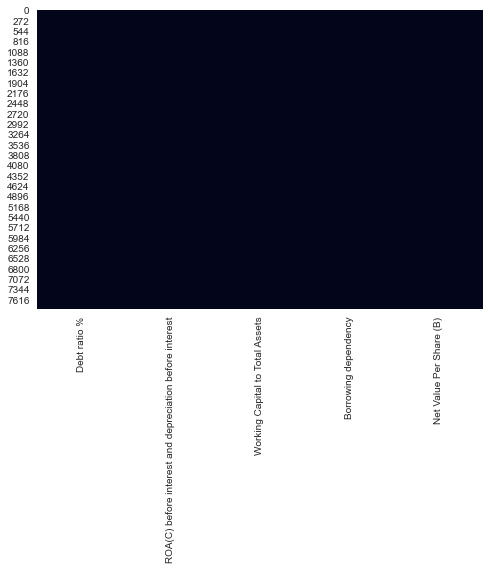

In [109]:
#Preprocessing 
sns.heatmap(X11.isnull(), cbar=False)
X11 = X11.dropna()
X11.info()


In [110]:
#X11.set_index('index', inplace=True)
# Printing the dataframe
X11.reset_index(level=0, inplace=True)
X11

,index,Debt ratio %,ROA(C) before interest and depreciation before interest,Working Capital to Total Assets,Borrowing dependency,Net Value Per Share (B)
0,0,-0.877927,-0.103694,0.246696,-0.144913,-0.245876
1,1,0.889159,-0.850814,-0.609887,-0.023974,-0.810646
2,2,-0.059033,-1.677584,0.071960,-0.127459,-0.574514
3,3,-0.571692,-0.365744,0.347332,-0.277841,0.049899
4,4,-1.065637,0.674489,2.044436,-0.289581,-0.421149
5,5,0.062893,-0.631776,0.412014,-0.139944,-0.379765
6,6,-0.644281,-0.122810,1.901515,-0.289581,-0.447927
7,7,0.991237,-0.159449,-1.424902,0.293315,-0.210577
8,8,-1.840297,1.094246,0.818301,-0.289581,-0.401674
9,9,-0.647684,1.337976,0.222035,-0.246286,1.324284


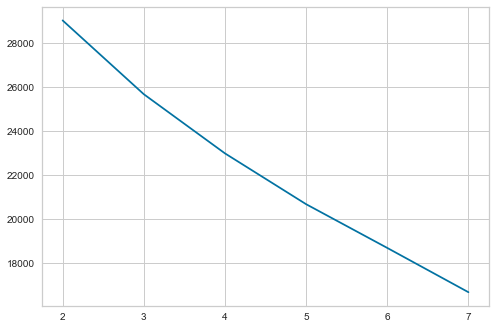

In [111]:
#Elbow process and standarization
from sklearn.preprocessing import StandardScaler
import numpy
scaler = StandardScaler()
X_std11= scaler.fit_transform(X11) 
from sklearn.cluster import KMeans
withinss = []
for i in range (2,8):
     kmeans = KMeans(n_clusters=i)
     model = kmeans.fit(X_std11)
     withinss.append(model.inertia_)
from matplotlib import pyplot
pyplot.plot([2,3,4,5,6,7],withinss)

In [112]:
#silhouette score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
kmeans = KMeans(n_clusters=3)
model = kmeans.fit(X_std11)
labels = model.labels_
from sklearn.metrics import silhouette_samples
silhouette = silhouette_samples(X_std11,labels)
silhouette_avg = silhouette_score(X_std11,labels)
#print("The average silhouette_score is :", silhouette_avg)

import pandas
df4 = pandas.DataFrame({'label':labels,'silhouette':silhouette})
#print('Average Silhouette Score for Cluster 0: ',np.average(df4[df4['label'] == 0].silhouette))
#print('Average Silhouette Score for Cluster 1: ',np.average(df4[df4['label'] == 1].silhouette))
#print('Average Silhouette Score for Cluster 2: ',np.average(df4[df4['label'] == 2].silhouette))
#print('Average Silhouette Score for Cluster 3: ',np.average(df4[df4['label'] == 3].silhouette))
#print('Average Silhouette Score for Cluster 4: ',np.average(df4[df4['label'] == 4].silhouette))
#print('Average Silhouette Score for Cluster 5: ',np.average(df4[df4['label'] == 5].silhouette))
df4

The average silhouette_score is : 0.22642289081320982
Average Silhouette Score for Cluster 0:  0.2292598838077534
Average Silhouette Score for Cluster 1:  0.2617690898414917
Average Silhouette Score for Cluster 2:  0.15309834634837943


In [113]:
#silhouette score
from sklearn.metrics import silhouette_score
silhouette_score(X_std11,labels)

0.22642289081320982

In [114]:
#Data retrival and merger 
def ClusterIndicesComp(clustNum, labels_array): #list comprehension
    return np.array([i for i, x in enumerate(labels_array) if x == clustNum])

In [115]:
ab0=ClusterIndicesComp(0, labels)
dataframe0=pd.DataFrame(ab0, columns=["index"]) 
print (dataframe0)
dataframe0.info()
result0 = pd.merge(dataframe0,X11,on='index',how="left")

      index
0         1
1         2
2         5
3         7
4        12
5        13
6        17
7        18
8        19
9        20
10       21
11       24
12       27
13       28
14       29
15       32
16       35
17       38
18       39
19       40
20       41
21       44
22       47
23       48
24       54
25       55
26       56
27       57
28       62
29       63
30       70
31       80
32       81
33       86
34       87
35       92
36       93
37       94
38       95
39       96
40       99
41      100
42      101
43      102
44      106
45      108
46      110
47      112
48      113
49      117
50      118
51      119
52      122
53      124
54      126
55      127
56      128
57      132
58      134
59      136
60      140
61      142
62      146
63      147
64      148
65      150
66      151
67      152
68      154
69      158
70      159
71      160
72      161
73      163
74      172
75      175
76      176
77      181
78      182
79      183
80      184
81      185
82  

In [116]:
m0=result0.median()
des0=result0.describe()
des0

,index,Debt ratio %,ROA(C) before interest and depreciation before interest,Working Capital to Total Assets,Borrowing dependency,Net Value Per Share (B)
count,2726.000000,2726.000000,2726.000000,2726.000000,2726.000000,2726.000000
mean,2878.668379,0.351197,-0.422282,-0.321315,0.038298,-0.324396
std,1821.942297,0.717582,0.711231,0.678174,0.212306,0.455525
min,1.000000,-2.102297,-4.394456,-3.443600,-0.289581,-1.705272
25%,1429.250000,-0.096746,-0.772757,-0.774818,-0.111355,-0.575731
50%,2712.500000,0.330760,-0.339459,-0.372123,0.003730,-0.362116
75%,3928.250000,0.844642,0.005427,0.164664,0.156530,-0.104683
max,7859.000000,2.845656,1.734635,2.378520,1.141632,1.616407


In [117]:
ab1=ClusterIndicesComp(1, labels)
dataframe1=pd.DataFrame(ab1, columns=["index"]) 
print (dataframe1)
dataframe1.info()
result1 = pd.merge(dataframe1,X11,on='index',how="left")

      index
0        14
1        25
2        49
3        73
4        74
5       139
6       279
7       294
8       326
9       385
10      450
11      472
12      496
13      507
14      534
15      579
16      603
17      638
18      656
19      660
20      677
21      678
22      710
23      718
24      761
25      803
26      867
27      909
28      912
29      921
30      944
31      963
32      972
33      975
34      998
35     1033
36     1068
37     1109
38     1121
39     1137
40     1159
41     1167
42     1173
43     1177
44     1202
45     1213
46     1241
47     1261
48     1286
49     1325
50     1327
51     1337
52     1370
53     1379
54     1421
55     1453
56     1477
57     1478
58     1580
59     1592
60     1593
61     1599
62     1603
63     1653
64     1693
65     1708
66     1731
67     1749
68     1800
69     1846
70     1862
71     1865
72     1873
73     1905
74     1907
75     1971
76     1978
77     1985
78     1997
79     2014
80     2018
81     2049
82  

In [ ]:
m1=result1.median()
#des1=result1.describe()
#des1

In [119]:
ab2=ClusterIndicesComp(2, labels)
dataframe2=pd.DataFrame(ab2, columns=["index"]) 
print (dataframe2)
dataframe2.info()
result2 = pd.merge(dataframe2,X11,on='index',how="left")

      index
0         0
1         3
2         4
3         6
4         8
5         9
6        10
7        11
8        15
9        16
10       22
11       23
12       26
13       30
14       31
15       33
16       34
17       36
18       37
19       42
20       43
21       45
22       46
23       50
24       51
25       52
26       53
27       58
28       59
29       60
30       61
31       64
32       65
33       66
34       67
35       68
36       69
37       71
38       72
39       75
40       76
41       77
42       78
43       79
44       82
45       83
46       84
47       85
48       88
49       89
50       90
51       91
52       97
53       98
54      103
55      104
56      105
57      107
58      109
59      111
60      114
61      115
62      116
63      120
64      121
65      123
66      125
67      129
68      130
69      131
70      133
71      135
72      137
73      138
74      141
75      143
76      144
77      145
78      149
79      153
80      155
81      156
82  

In [120]:
m2=result2.median()
des2=result2.describe()
des2

,index,Debt ratio %,ROA(C) before interest and depreciation before interest,Working Capital to Total Assets,Borrowing dependency,Net Value Per Share (B)
count,1743.000000,1743.000000,1743.000000,1743.000000,1743.000000,1743.000000
mean,1891.815261,-0.719377,0.531726,0.638553,-0.218112,0.471953
std,1171.573742,0.672812,0.894781,0.895348,0.099586,1.183509
min,0.000000,-2.111938,-2.591173,-1.869672,-0.289581,-1.525130
25%,859.000000,-1.242856,-0.059886,-0.017933,-0.289581,-0.184408
50%,1839.000000,-0.787758,0.448282,0.580103,-0.259020,0.192309
75%,2885.000000,-0.247594,1.025747,1.222018,-0.181621,0.811244
max,4241.000000,1.465900,5.858130,2.964073,0.555382,23.373467


In [134]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as shc

In [135]:
# Scaling the data so that all the features become comparable
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X11)
  
# Normalizing the data so that the data approximately 
# follows a Gaussian distribution
X_normalized = normalize(X_scaled)
  
# Converting the numpy array into a pandas DataFrame
X_normalized = pd.DataFrame(X_normalized)

In [136]:
pca = PCA(n_components = 2)
X_principal = pca.fit_transform(X_normalized)
X_principal = pd.DataFrame(X_principal)
X_principal.columns = ['P1', 'P2']

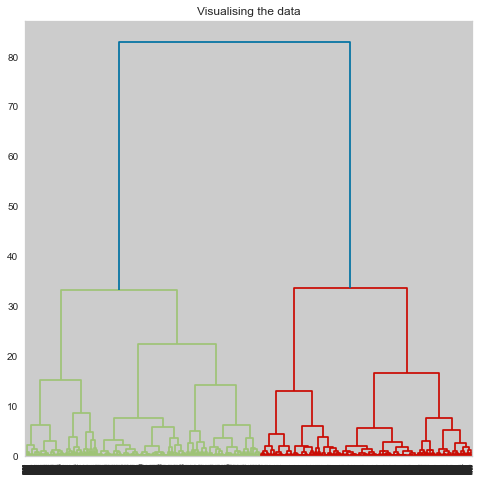

In [137]:
plt.figure(figsize =(8, 8))
plt.title('Visualising the data')
Dendrogram = shc.dendrogram((shc.linkage(X_principal, method ='ward')))

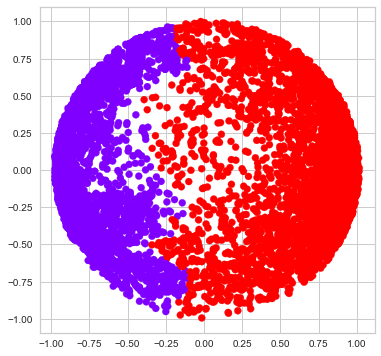

In [138]:
ac2 = AgglomerativeClustering(n_clusters = 2)
  
# Visualizing the clustering
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'], 
           c = ac2.fit_predict(X_principal), cmap ='rainbow')
plt.show()

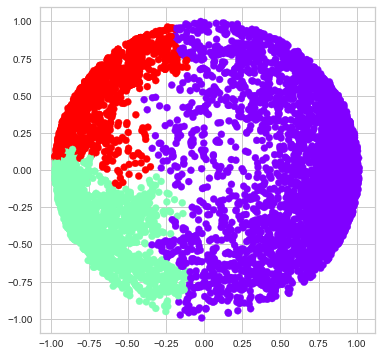

In [139]:
ac3 = AgglomerativeClustering(n_clusters = 3)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
           c = ac3.fit_predict(X_principal), cmap ='rainbow')
plt.show()

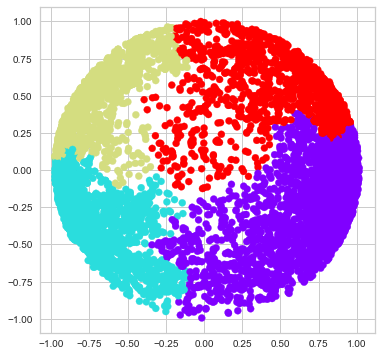

In [140]:
ac4 = AgglomerativeClustering(n_clusters = 4)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
            c = ac4.fit_predict(X_principal), cmap ='rainbow')
plt.show()

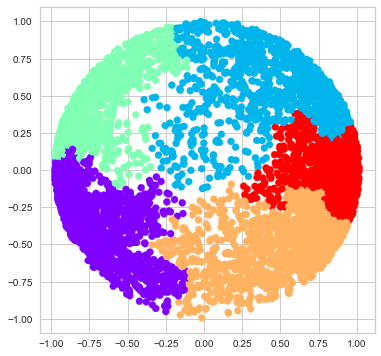

In [141]:
ac5 = AgglomerativeClustering(n_clusters = 5)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
            c = ac5.fit_predict(X_principal), cmap ='rainbow')
plt.show()

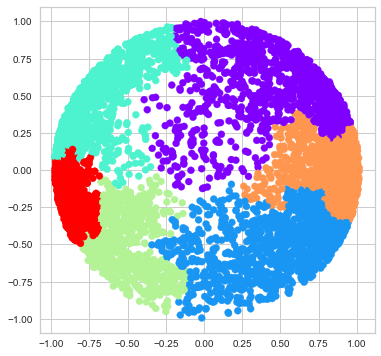

In [142]:
ac6 = AgglomerativeClustering(n_clusters = 6)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
            c = ac6.fit_predict(X_principal), cmap ='rainbow')
plt.show()

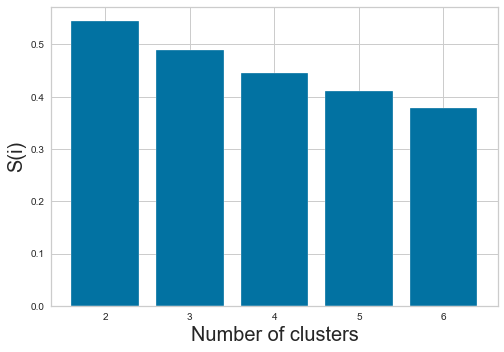

In [143]:
k = [2, 3, 4, 5, 6]
  
# Appending the silhouette scores of the different models to the list
silhouette_scores = []
silhouette_scores.append(
        silhouette_score(X_principal, ac2.fit_predict(X_principal)))
silhouette_scores.append(
        silhouette_score(X_principal, ac3.fit_predict(X_principal)))
silhouette_scores.append(
        silhouette_score(X_principal, ac4.fit_predict(X_principal)))
silhouette_scores.append(
        silhouette_score(X_principal, ac5.fit_predict(X_principal)))
silhouette_scores.append(
        silhouette_score(X_principal, ac6.fit_predict(X_principal)))
  
# Plotting a bar graph to compare the results
plt.bar(k, silhouette_scores)
plt.xlabel('Number of clusters', fontsize = 20)
plt.ylabel('S(i)', fontsize = 20)
plt.show()


Text(0, 0.5, 'Inertia')

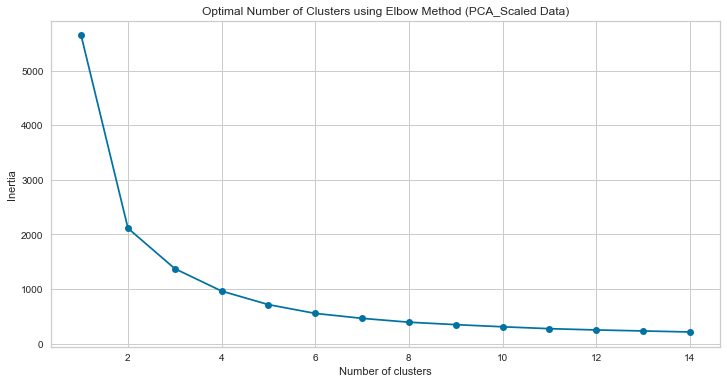

In [144]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(X_principal)
    sse.append([k, km.inertia_])
    
pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (PCA_Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [147]:
kmeans_pca_scale = KMeans(n_clusters=4, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(X_principal)
print('KMeans PCA Scaled Silhouette Score: {}'.format(silhouette_score(X_principal, kmeans_pca_scale.labels_, metric='euclidean')))
labels_pca_scale = kmeans_pca_scale.labels_
clusters_pca_scale = pd.concat([X_principal, pd.DataFrame({'pca_clusters':labels_pca_scale})], axis=1)

KMeans PCA Scaled Silhouette Score: 0.4580856325196692


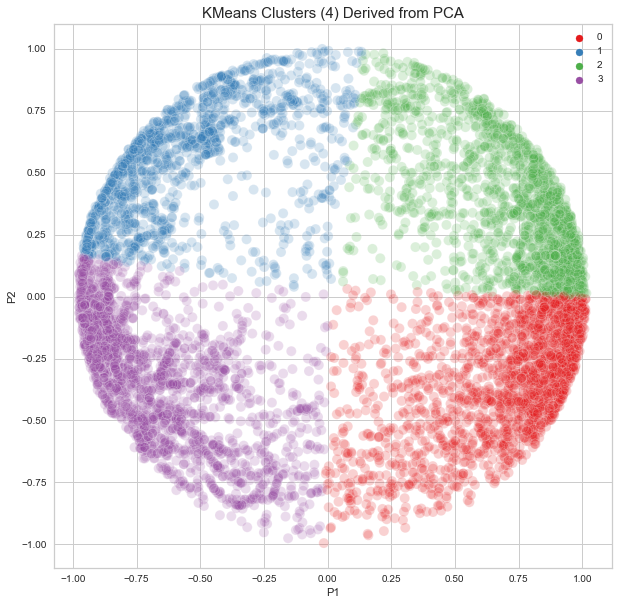

In [148]:
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_pca_scale.iloc[:,0],clusters_pca_scale.iloc[:,1], hue=labels_pca_scale, palette='Set1', s=100, alpha=0.2).set_title('KMeans Clusters (4) Derived from PCA', fontsize=15)
plt.legend()
plt.show()

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 7866 samples in 0.027s...
[t-SNE] Computed neighbors for 7866 samples in 0.612s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7866
[t-SNE] Computed conditional probabilities for sample 2000 / 7866
[t-SNE] Computed conditional probabilities for sample 3000 / 7866
[t-SNE] Computed conditional probabilities for sample 4000 / 7866
[t-SNE] Computed conditional probabilities for sample 5000 / 7866
[t-SNE] Computed conditional probabilities for sample 6000 / 7866
[t-SNE] Computed conditional probabilities for sample 7000 / 7866
[t-SNE] Computed conditional probabilities for sample 7866 / 7866
[t-SNE] Mean sigma: 0.037735
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.947479
[t-SNE] KL divergence after 5000 iterations: 0.409932


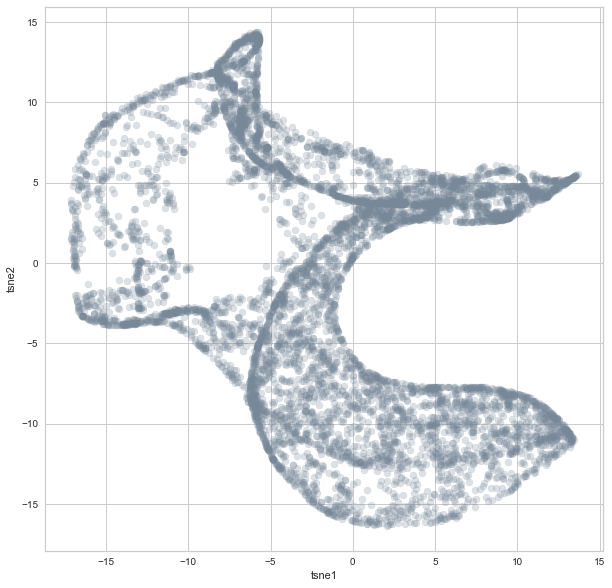

In [149]:
tsne = TSNE(n_components=3, verbose=1, perplexity=80, n_iter=5000, learning_rate=200)
tsne_scale_results = tsne.fit_transform(X_principal)
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=['tsne1', 'tsne2', 'tsne3'])
plt.figure(figsize = (10,10))
plt.scatter(tsne_df_scale.iloc[:,0],tsne_df_scale.iloc[:,1],alpha=0.25, facecolor='lightslategray')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.show()

Text(0, 0.5, 'Inertia')

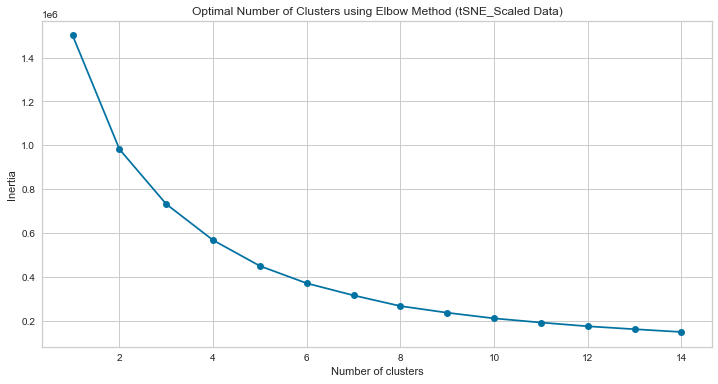

In [150]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(tsne_df_scale)
    sse.append([k, km.inertia_])
    
tsne_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (tSNE_Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [151]:
kmeans_tsne_scale = KMeans(n_clusters=4, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(tsne_df_scale)
print('KMeans tSNE Scaled Silhouette Score: {}'.format(silhouette_score(tsne_df_scale, kmeans_tsne_scale.labels_, metric='euclidean')))
labels_tsne_scale = kmeans_tsne_scale.labels_
clusters_tsne_scale = pd.concat([tsne_df_scale, pd.DataFrame({'tsne_clusters':labels_tsne_scale})], axis=1)

KMeans tSNE Scaled Silhouette Score: 0.3258635997772217


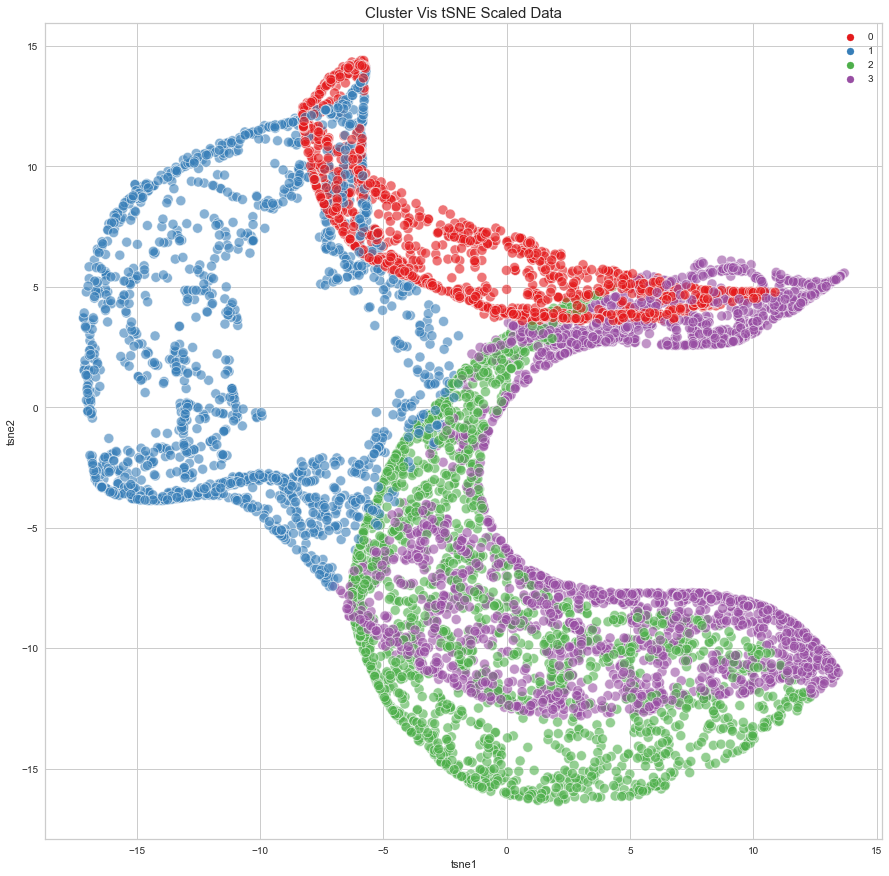

In [152]:
plt.figure(figsize = (15,15))
sns.scatterplot(clusters_tsne_scale.iloc[:,0],clusters_tsne_scale.iloc[:,1],hue=labels_tsne_scale, palette='Set1', s=100, alpha=0.6).set_title('Cluster Vis tSNE Scaled Data', fontsize=15)
plt.legend()
plt.show()

In [154]:
import plotly.graph_objs as go
Scene = dict(xaxis = dict(title  = 'tsne1'),yaxis = dict(title  = 'tsne2'),zaxis = dict(title  = 'tsne3'))
labels = labels_tsne_scale
trace = go.Scatter3d(x=clusters_tsne_scale.iloc[:,0], y=clusters_tsne_scale.iloc[:,1], z=clusters_tsne_scale.iloc[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'yellow',width = 5)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

In [155]:
cluster_tsne_profile = pd.merge(X11, clusters_tsne_scale['tsne_clusters'], left_index=True, right_index=True )
cluster_pca_profile = pd.merge(X11, clusters_pca_scale['pca_clusters'], left_index=True, right_index=True )

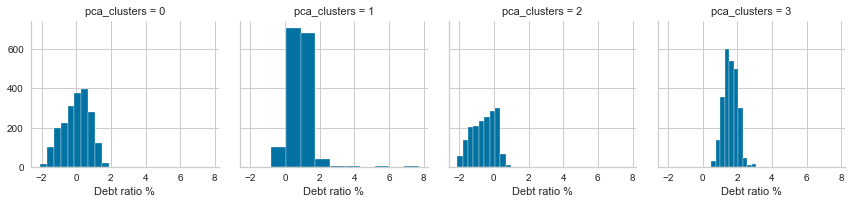

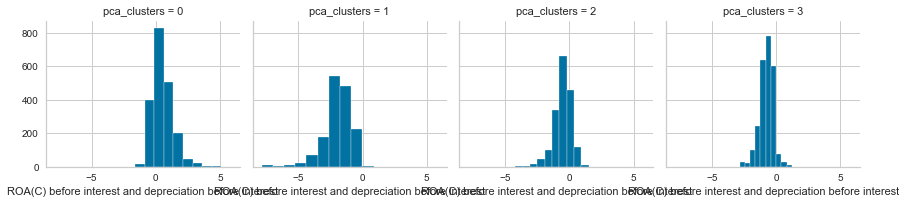

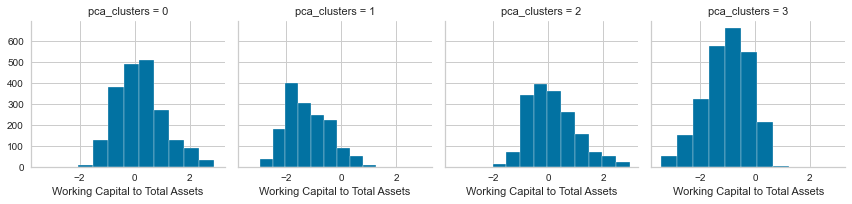

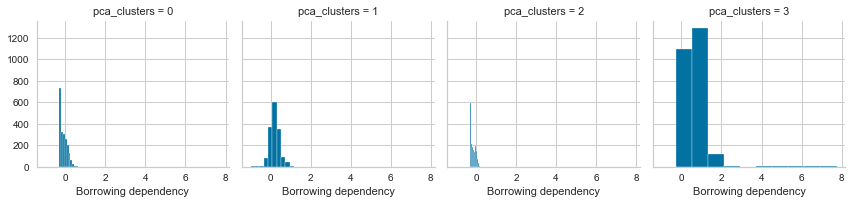

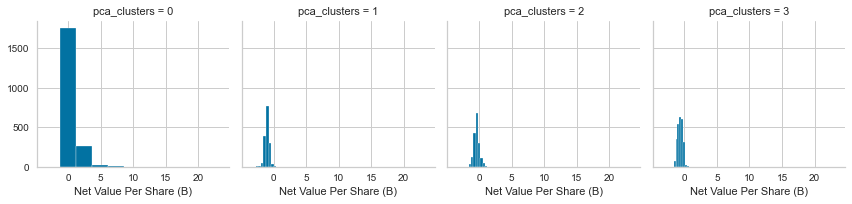

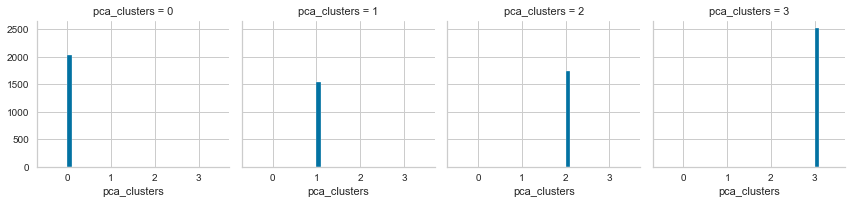

In [156]:
for c in cluster_pca_profile:
    grid = sns.FacetGrid(cluster_pca_profile, col='pca_clusters')
    grid.map(plt.hist, c)

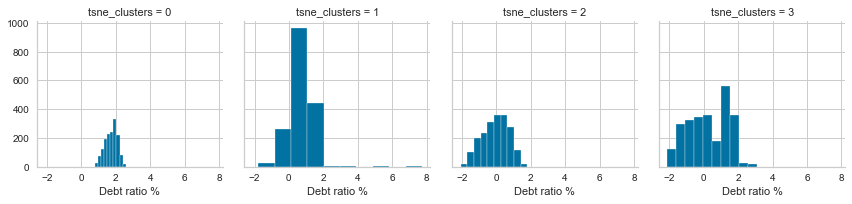

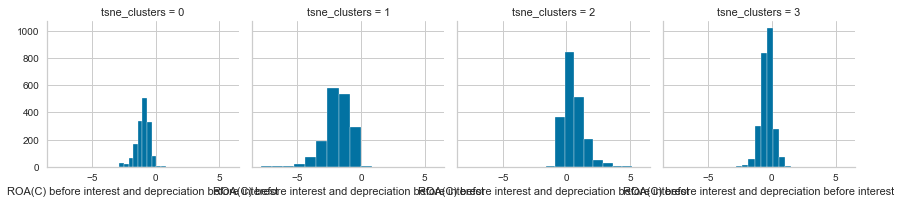

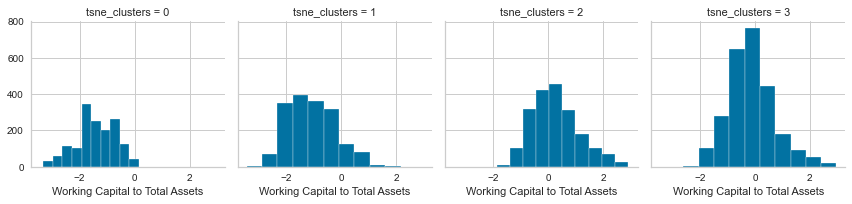

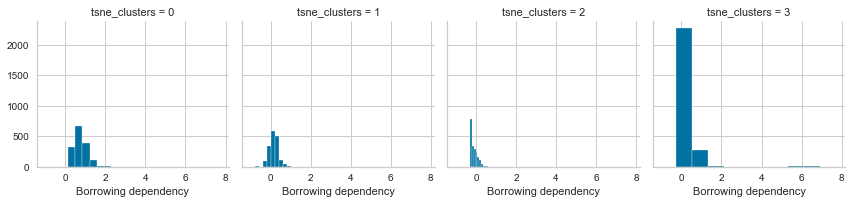

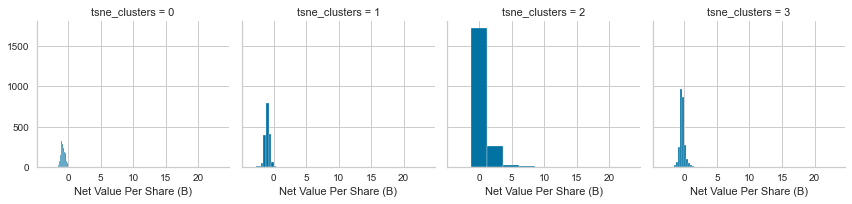

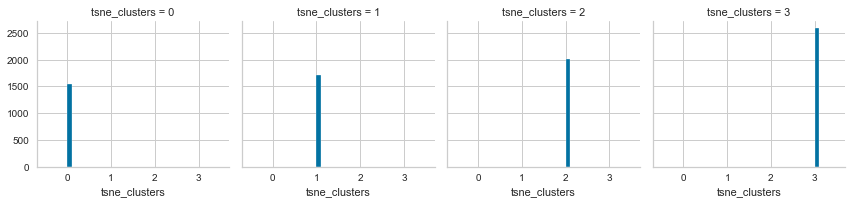

In [157]:
for c in cluster_tsne_profile:
    grid = sns.FacetGrid(cluster_tsne_profile, col='tsne_clusters')
    grid.map(plt.hist, c)

Text(0.5, 1.0, '(tSNE) Clusters by Working Capital to Total Assets  and Debt ratio %')

<Figure size 1080x720 with 0 Axes>

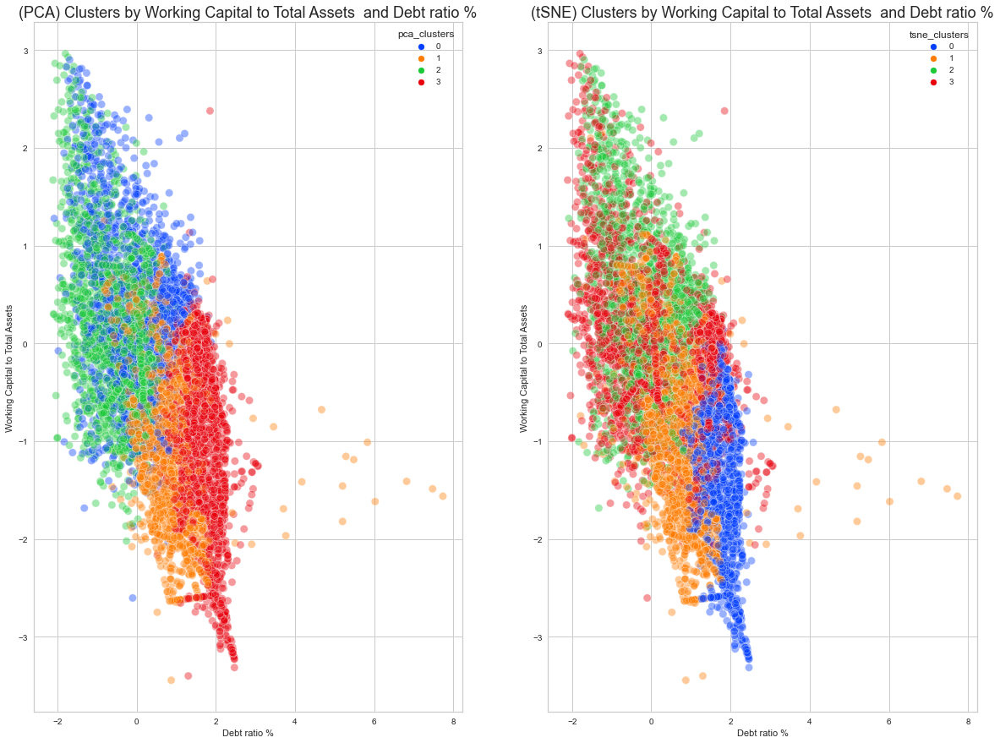

In [160]:
plt.figure(figsize=(15,10))
fig , (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))
sns.scatterplot(data=cluster_pca_profile, x='Debt ratio %', y='Working Capital to Total Assets', 
                hue='pca_clusters', s=85, alpha=0.4, palette='bright', ax=ax1).set_title(
    '(PCA) Clusters by Working Capital to Total Assets  and Debt ratio %',fontsize=18)
sns.scatterplot(data=cluster_tsne_profile, x='Debt ratio %', y='Working Capital to Total Assets', 
                hue='tsne_clusters', s=85, alpha=0.4, palette='bright', ax=ax2).set_title('(tSNE) Clusters by Working Capital to Total Assets  and Debt ratio %', fontsize=18)